# pySCENIC protocol: 7seq data

June 2020

Dataset: 7seq from Dominic

This notebook uses a loom file generated from the first part of the SCENIC protocol, described in: [PBMC10k_SCENIC-protocol-CLI.ipynb](https://github.com/aertslab/SCENICprotocol/blob/master/notebooks/PBMC10k_SCENIC-protocol-CLI.ipynb)

In [169]:
# import dependencies
import os
import numpy as np
import pandas as pd
import scanpy as sc
import loompy as lp
from MulticoreTSNE import MulticoreTSNE as TSNE
import json
import base64
import zlib
from pyscenic.plotting import plot_binarization
from pyscenic.export import add_scenic_metadata
from pyscenic.cli.utils import load_signatures
import matplotlib as mpl
import matplotlib.pyplot as plt
# from scanpy.plotting._tools.scatterplots import plot_scatter
import seaborn as sns

#### set variables for file paths to read from and write to:

In [173]:
# set a working directory
wdir = '/home/skevin/single_cell_projects/integrated_projects/7-seq_050120/'
os.chdir( wdir )
os.getcwd()

'/dataVolume/storage/single_cell_projects/integrated_projects/7-seq_050120'

In [174]:
# path to loom output, generated from a combination of Scanpy and pySCENIC results:
f_final_loom = 'output/scenic/Final_dataset_duplicate_070320-final.loom'

In [175]:
sc.settings.verbosity = 3 # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()
sc.settings.set_figure_params(dpi=150)

-----
anndata     0.7.4
scanpy      1.6.0
sinfo       0.3.1
-----
MulticoreTSNE       NA
PIL                 7.2.0
adjustText          NA
anndata             0.7.4
attr                20.2.0
backcall            0.2.0
boltons             NA
cairo               1.19.1
cffi                1.11.5
cloudpickle         1.6.0
cycler              0.10.0
cython_runtime      NA
cytoolz             0.10.1
dask                1.0.0
dateutil            2.8.1
decorator           4.4.2
frozendict          NA
get_version         2.1
h5py                2.10.0
idna                2.10
igraph              0.8.2
importlib_metadata  1.7.0
ipykernel           5.3.0
ipython_genutils    0.2.0
jedi                0.17.1
jinja2              2.11.2
joblib              0.16.0
jsonschema          3.2.0
kiwisolver          1.2.0
legacy_api_wrap     1.2
llvmlite            0.33.0+1.g022ab0f
loompy              3.0.6
louvain             0.6.1
markupsafe          1.1.1
matplotlib          3.3.1
mkl                 2.3

## Extract relevant data from the integrated loom file

In [176]:
# scenic output
lf = lp.connect( f_final_loom, mode='r', validate=False )
meta = json.loads(zlib.decompress(base64.b64decode( lf.attrs.MetaData )))
exprMat = pd.DataFrame( lf[:,:], index=lf.ra.Gene, columns=lf.ca.CellID).T
auc_mtx = pd.DataFrame( lf.ca.RegulonsAUC, index=lf.ca.CellID)

In [177]:
thresholds = {}
for i in meta['regulonThresholds']:
    j=i['regulon']
#     print(j)
    thresholds[j] = i['defaultThresholdValue']

In [178]:
# create a dictionary of regulons:
regulons = {}
for i,r in pd.DataFrame(lf.ra.Regulons,index=lf.ra.Gene).iteritems():
    regulons[i] =  list(r[r==1].index.values)

In [179]:
# capture embeddings:
dr = [
    pd.DataFrame( lf.ca.Embedding, index=lf.ca.CellID )
]
dr_names = [
    meta['embeddings'][0]['name'].replace(" ","_")
]

# add other embeddings
drx = pd.DataFrame( lf.ca.Embeddings_X, index=lf.ca.CellID )
dry = pd.DataFrame( lf.ca.Embeddings_Y, index=lf.ca.CellID )

for i in range( len(drx.columns) ):
    dr.append( pd.concat( [ drx.iloc[:,i], dry.iloc[:,i] ], sort=False, axis=1, join='outer' ))
    dr_names.append( meta['embeddings'][i+1]['name'].replace(" ","_").replace('/','-') )

# rename columns:
for i,x in enumerate( dr ):
    x.columns = ['X','Y']

In [180]:
lf.close()

### Alternately, we can load this data into a `scanpy.AnnData` object

This can be done directly from the integrated loom file, with a few modifications to allow for SCENIC- and SCope-specific loom attributes:

In [181]:
adata = sc.read( f_final_loom, validate=False)

--> This might be very slow. Consider passing `cache=True`, which enables much faster reading from a cache file.


In [182]:
# drop the embeddings and extra attributes from the obs object
adata.obs.drop( ['Embedding','Embeddings_X','Embeddings_Y','RegulonsAUC'], axis=1, inplace=True )

In [183]:
# add the embeddings into the adata.obsm object
for i,x in enumerate( dr ):
    adata.obsm[ 'X_'+dr_names[i] ] = x.values

In [184]:
sc._utils.sanitize_anndata( adata )

... storing 'ClusterID' as categorical
... storing 'Clusterings' as categorical
... storing 'Louvain_clusters_Scanpy' as categorical
... storing 'Phase' as categorical
... storing 'batch' as categorical
... storing 'integrated_snn_res.0.2' as categorical
... storing 'integrated_snn_res.0.4' as categorical
... storing 'integrated_snn_res.0.6' as categorical
... storing 'integrated_snn_res.0.8' as categorical
... storing 'integrated_snn_res.1' as categorical
... storing 'integrated_snn_res.1.2' as categorical
... storing 'integrated_snn_res.1.4' as categorical
... storing 'integrated_snn_res.1.6' as categorical
... storing 'integrated_snn_res.1.8' as categorical
... storing 'integrated_snn_res.2' as categorical
... storing 'louvain' as categorical
... storing 'sample_id' as categorical
... storing 'Regulons' as categorical


In [185]:
# cell annotations from the anndata column attributes:
cellAnnot = adata.obs

#### We can also add all metadata derived from SCENIC to the `scanpy.AnnData` object.

In [186]:
# # load the regulons from a file using the load_signatures function
# sig = load_signatures('reg.csv')
# adata = add_scenic_metadata(adata, auc_mtx, sig)

---
## Display a motifs table with motif logos

#### View the motifs table along with motif logos

In [187]:
# # helper functions (not yet integrated into pySCENIC):

# from pyscenic.utils import load_motifs
# import operator as op
# from IPython.display import HTML, display

# BASE_URL = "http://motifcollections.aertslab.org/v9/logos/"
# COLUMN_NAME_LOGO = "MotifLogo"
# COLUMN_NAME_MOTIF_ID = "MotifID"
# COLUMN_NAME_TARGETS = "TargetGenes"

# def display_logos(df: pd.DataFrame, top_target_genes: int = 3, base_url: str = BASE_URL):
#     """
#     :param df:
#     :param base_url:
#     """
#     # Make sure the original dataframe is not altered.
#     df = df.copy()
    
#     # Add column with URLs to sequence logo.
#     def create_url(motif_id):
#         return '<img src="{}{}.png" style="max-height:124px;"></img>'.format(base_url, motif_id)
#     df[("Enrichment", COLUMN_NAME_LOGO)] = list(map(create_url, df.index.get_level_values(COLUMN_NAME_MOTIF_ID)))
    
#     # Truncate TargetGenes.
#     def truncate(col_val):
#         return sorted(col_val, key=op.itemgetter(1))[:top_target_genes]
#     df[("Enrichment", COLUMN_NAME_TARGETS)] = list(map(truncate, df[("Enrichment", COLUMN_NAME_TARGETS)]))
    
#     MAX_COL_WIDTH = pd.get_option('display.max_colwidth')
#     pd.set_option('display.max_colwidth', 200)
#     display(HTML(df.head().to_html(escape=False)))
#     pd.set_option('display.max_colwidth', MAX_COL_WIDTH)

In [188]:
# df_motifs = load_motifs('reg.csv')

In [189]:
# selected_motifs = ['PAX5','TCF3','EBF1']
# df_motifs_sel = df_motifs.iloc[ [ True if x in selected_motifs else False for x in df_motifs.index.get_level_values('TF') ] ,:]

In [190]:
# #display_logos(df_motifs.head())
# display_logos( df_motifs_sel.sort_values([('Enrichment','NES')], ascending=False).head(9))

---
# Dimensionality reduction plots

### Alternately, we can plot two dimensionality reductions side-by-side

(this uses non-Scanpy plotting functions)

In [191]:
def colorMap( x, palette='bright' ):
    import natsort
    from collections import OrderedDict
    #
    n=len(set(x))
    cpalette = sns.color_palette(palette,n_colors=n )
    cdict = dict( zip( list(set(x)), cpalette ))
    cmap = [ cdict[i] for i in x ]
    cdict = OrderedDict( natsort.natsorted(cdict.items()) )
    return cmap,cdict

def drplot( dr, colorlab, ax, palette='bright', title=None, **kwargs ):
    cmap,cdict = colorMap( colorlab, palette )
    for lab,col in cdict.items():  
        ix = colorlab.loc[colorlab==lab].index
        ax.scatter( dr['X'][ix], dr['Y'][ix], c=[col]*len(ix), alpha=0.7, label=lab, edgecolors='none')
    if( title is not None ):
        ax.set_title(title, fontsize='x-large');
    #
    ax.set_xticks([])
    ax.set_yticks([])
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)


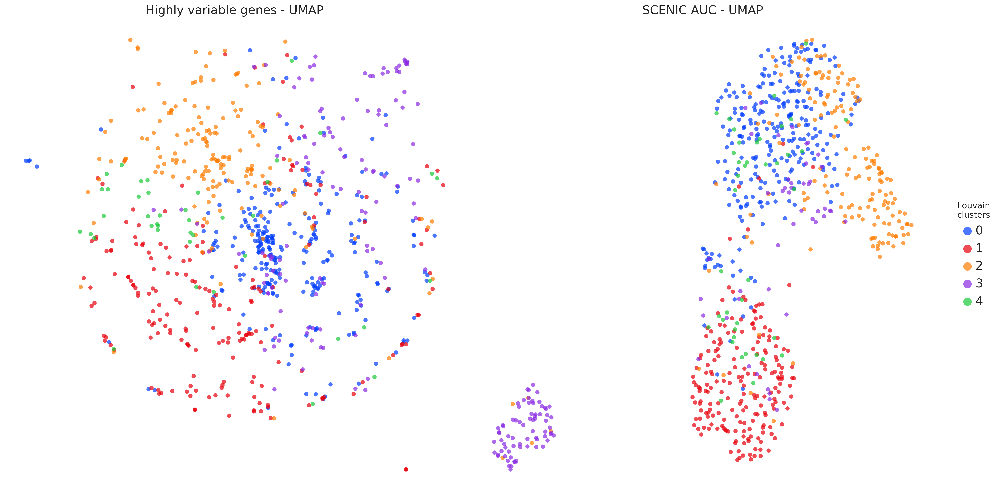

In [192]:
plt.rcParams.update({'font.size':12})

fig, (ax1,ax2) = plt.subplots(1,2, figsize=(20,10), dpi=150 )

drplot( dr[0], colorlab=cellAnnot['Louvain_clusters_Scanpy'], ax=ax1, palette='bright', s=2, title='Highly variable genes - UMAP' )

drplot( dr[4], colorlab=cellAnnot['Louvain_clusters_Scanpy'], ax=ax2, palette='bright', s=2, title='SCENIC AUC - UMAP' )
ax2.legend(loc='right', bbox_to_anchor=(1.15, 0.5), ncol=1, markerscale=2, fontsize='x-large', frameon=False, title="Louvain\nclusters")

plt.tight_layout()
plt.savefig("PBMC10k_dimred_umap-hvg-scenic-louvain.pdf", dpi=600, bbox_inches = "tight")

In [193]:
from pyscenic.rss import regulon_specificity_scores
from pyscenic.plotting import plot_rss
import matplotlib.pyplot as plt
from adjustText import adjust_text
import seaborn as sns
from pyscenic.binarization import binarize

### RSS panel plot with all cell types

In [194]:
def palplot(pal, names, colors=None, size=1):
    n = len(pal)
    f, ax = plt.subplots(1, 1, figsize=(n * size, size))
    ax.imshow(np.arange(n).reshape(1, n),
              cmap=mpl.colors.ListedColormap(list(pal)),
              interpolation="nearest", aspect="auto")
    ax.set_xticks(np.arange(n) - .5)
    ax.set_yticks([-.5, .5])
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    colors = n * ['k'] if colors is None else colors
    for idx, (name, color) in enumerate(zip(names, colors)):
        ax.text(0.0+idx, 0.0, name, color=color, horizontalalignment='center', verticalalignment='center')
    return f

# Regulon specificity scores (RSS) across cell metadata

## Metadata = Abbreviated Cell Type Names

In [195]:
cluster_cell_type_dict = {'7':'RPC', '9':'MG', '2':'iPRP', '1':'LM1', '3':'LM2', '4':'LM3', 
'6':'LM4', '10':'S', '8':'TR', '0':'ER', '5':'LR'}

adata.obs['cell_type'] = adata.obs["integrated_snn_res.1.6"].map(cluster_cell_type_dict)

cell_type_order = ['RPC', 'MG', 'iPRP', 'LM1', 'LM2', 'LM3', 'LM4', 'S', 'TR', 'ER', 'LR']

adata.obs.cell_type = pd.Categorical(adata.obs.cell_type, ordered=True, categories=cell_type_order)

In [196]:
metavar="cell_type"

cats = list(cellAnnot[metavar].values.categories)

## Metadata = Louvain clusters at resolution 1.6

In [197]:
# metavar="integrated_snn_res.1.6"

# cats = sorted( list(set(cellAnnot[metavar])), key=int )

### Calculate RSS

In [198]:
rss_louvain = regulon_specificity_scores( auc_mtx, cellAnnot[metavar] )
rss_louvain

,ATF4_(+),CEBPB_(+),CRX_(+),CUX1_(+),E2F1_(+),E2F2_(+),E2F3_(+),E2F4_(+),E2F7_(+),E2F8_(+),...,SOX2_(+),SOX9_(+),SP3_(+),SPI1_(+),TFDP1_(+),THAP11_(+),THRB_(+),VEZF1_(+),VSX2_(+),ZBTB7A_(+)
ER,0.349043,0.236415,0.358080,0.342666,0.325843,0.259755,0.263929,0.299233,0.321946,0.319713,...,0.325970,0.314698,0.329690,0.197329,0.330248,0.350630,0.256900,0.356309,0.332675,0.364698
TR,0.215196,0.210367,0.215659,0.220526,0.218672,0.218654,0.216559,0.215690,0.221335,0.220838,...,0.226447,0.232019,0.223364,0.229020,0.211767,0.213242,0.202715,0.223224,0.228660,0.221273
LM3,0.271908,0.193482,0.285706,0.268374,0.257489,0.208304,0.212783,0.243312,0.255912,0.255443,...,0.248900,0.238770,0.240609,0.212986,0.272244,0.268944,0.328075,0.248974,0.247722,0.273843
LM1,0.305102,0.219776,0.324580,0.298306,0.289732,0.228443,0.225567,0.283437,0.289911,0.286040,...,0.281049,0.272304,0.282636,0.202664,0.305366,0.303097,0.372493,0.296370,0.282836,0.316325
iPRP,0.277140,0.232382,0.275810,0.276106,0.277517,0.235924,0.246270,0.251993,0.275620,0.273578,...,0.278418,0.273298,0.267658,0.199229,0.277467,0.280153,0.287558,0.286308,0.279272,0.271870
MG,0.219688,0.302922,0.182515,0.208346,0.261309,0.226726,0.275366,0.247389,0.261085,0.247781,...,0.296065,0.319444,0.253820,0.217456,0.223871,0.223023,0.174498,0.199578,0.286857,0.198767
LR,0.275839,0.190050,0.283421,0.262955,0.242353,0.193274,0.209005,0.234385,0.240147,0.240948,...,0.236346,0.233452,0.235998,0.188772,0.259715,0.257932,0.214546,0.270981,0.235752,0.266599
LM4,0.264336,0.201000,0.266764,0.244811,0.249434,0.191487,0.211760,0.234080,0.242214,0.243227,...,0.238638,0.226837,0.234397,0.225444,0.266863,0.262751,0.294500,0.245535,0.238649,0.245988
RPC,0.230280,0.393316,0.181303,0.213182,0.306052,0.525928,0.453884,0.259397,0.330396,0.341814,...,0.309532,0.335498,0.281645,0.279800,0.256116,0.236811,0.174272,0.211628,0.309207,0.201866
S,0.207084,0.183006,0.211858,0.208949,0.201472,0.184466,0.189265,0.196384,0.201049,0.203527,...,0.197673,0.197147,0.204350,0.180032,0.206746,0.205380,0.198723,0.205721,0.198798,0.207980


In [199]:
rss_louvain.to_csv(r'/dataVolume/storage/single_cell_projects/integrated_projects/7-seq_050120/src/scenic/102220_cellgrp_RSS_specificity_scores.csv', index = False)

### RSS panel plot with all louvain clusters

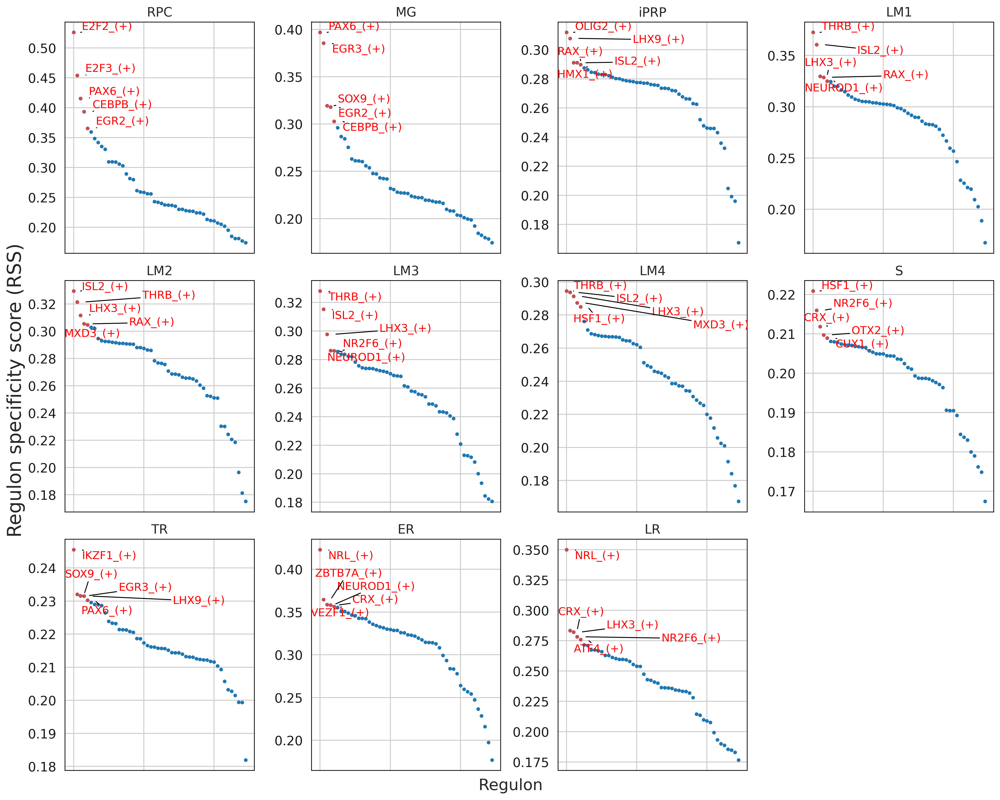

In [200]:
fig = plt.figure(figsize=(15, 12))
for c,num in zip(cats, range(1,len(cats)+1)):
    x=rss_louvain.T[c]
    ax = fig.add_subplot(3,4,num)
    plot_rss(rss_louvain, c, top_n=5, max_n=None, ax=ax)
    ax.set_ylim( x.min()-(x.max()-x.min())*0.05 , x.max()+(x.max()-x.min())*0.05 )
    for t in ax.texts:
        t.set_fontsize(12)
    ax.set_ylabel('')
    ax.set_xlabel('')
    adjust_text(ax.texts, autoalign='xy', ha='right', va='bottom', arrowprops=dict(arrowstyle='-',color='black'), precision=0.001 )
 
fig.text(0.5, 0.0, 'Regulon', ha='center', va='center', size='x-large')
fig.text(0.00, 0.5, 'Regulon specificity score (RSS)', ha='center', va='center', rotation='vertical', size='xx-large')
plt.tight_layout()
plt.rcParams.update({
    'figure.autolayout': True,
        'figure.titlesize': 'large' ,
        'axes.labelsize': 'medium',
        'axes.titlesize':'large',
        'xtick.labelsize':'medium',
        'ytick.labelsize':'medium'
        })
plt.savefig("Cell_Type-RSS-top5_RENAMED.pdf", dpi=150, bbox_inches = "tight")
plt.show()

### Select the top 5 regulons from each louvain cluster

In [142]:
topreg = []
for i,c in enumerate(cats):
    topreg.extend(
        list(rss_louvain.T[c].sort_values(ascending=False)[:5].index)
    )
topreg = list(set(topreg))

# Calculate mean AUC per cluster

In [143]:
topreg
auc_meta = pd.merge(adata.obs, auc_mtx, how = "left", left_index = True, right_index = True)
# adata.obs["integrated_snn_res.1.6"].value_counts()
# auc_mtx
mean_regulon_by_meta = auc_meta.groupby(metavar)[topreg].mean()
mean_regulon_by_meta

,HSF1_(+),NRL_(+),HMX1_(+),VEZF1_(+),LHX3_(+),MXD3_(+),SOX9_(+),EGR3_(+),RAX_(+),IKZF1_(+),...,ISL2_(+),EGR2_(+),THRB_(+),E2F2_(+),LHX9_(+),E2F3_(+),CRX_(+),CUX1_(+),ZBTB7A_(+),OLIG2_(+)
cell_type,,,,,,,,,,,,,,,,,,,,,
RPC,0.225215,0.136476,0.393523,0.129295,0.053583,0.316117,0.205364,0.040278,0.310300,0.017569,...,0.028317,0.114489,0.025719,0.253696,0.115662,0.152664,0.061065,0.050919,0.043954,0.069440
MG,0.166766,0.134701,0.362435,0.109907,0.057237,0.331604,0.220666,0.062073,0.281125,0.022672,...,0.038129,0.096023,0.030540,0.030567,0.118726,0.059027,0.083026,0.051386,0.047176,0.075099
iPRP,0.240347,0.152799,0.270459,0.220104,0.266728,0.319795,0.054443,0.003102,0.426189,0.010720,...,0.275682,0.017208,0.329441,0.017526,0.066872,0.015511,0.356868,0.070477,0.081818,0.102442
LM1,0.245975,0.155711,0.223162,0.175636,0.379721,0.345521,0.038678,0.003886,0.439123,0.010119,...,0.353013,0.015837,0.471389,0.010184,0.035292,0.008743,0.419689,0.065452,0.095857,0.039880
LM2,0.343272,0.174499,0.275002,0.182135,0.464221,0.482502,0.042283,0.001352,0.513533,0.010314,...,0.406377,0.020075,0.468232,0.011960,0.044672,0.010517,0.429181,0.071096,0.086445,0.058283
LM3,0.294933,0.163473,0.209489,0.151668,0.431235,0.414150,0.035812,0.001403,0.435423,0.010344,...,0.377040,0.018380,0.517207,0.009080,0.024545,0.009422,0.442370,0.069541,0.094950,0.024918
LM4,0.403573,0.195822,0.243153,0.182957,0.536868,0.566527,0.038549,0.001542,0.472484,0.009260,...,0.413464,0.019017,0.512361,0.006683,0.019409,0.011522,0.474923,0.063795,0.085354,0.045692
S,0.409027,0.195068,0.188187,0.201946,0.347034,0.359397,0.043904,0.001830,0.399754,0.011156,...,0.193939,0.010315,0.240643,0.011939,0.026485,0.012497,0.465452,0.077745,0.099131,0.061234
TR,0.134157,0.198710,0.213781,0.178954,0.161254,0.215041,0.066014,0.022438,0.255133,0.027601,...,0.128130,0.021127,0.171557,0.023665,0.053774,0.019743,0.290386,0.061011,0.082344,0.072215


#### Generate a heatmap

In [144]:
def palplot(pal, names, colors=None, size=1):
    n = len(pal)
    f, ax = plt.subplots(1, 1, figsize=(n * size, size))
    ax.imshow(np.arange(n).reshape(1, n),
              cmap=mpl.colors.ListedColormap(list(pal)),
              interpolation="nearest", aspect="auto")
    ax.set_xticks(np.arange(n) - .5)
    ax.set_yticks([-.5, .5])
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    colors = n * ['k'] if colors is None else colors
    for idx, (name, color) in enumerate(zip(names, colors)):
        ax.text(0.0+idx, 0.0, name, color=color, horizontalalignment='center', verticalalignment='center')
    return f

In [145]:
cellAnnot.index = cellAnnot.index.str.replace("ds20170407_S", "ds20170407-")
cellAnnot = cellAnnot.sort_values(metavar)
cellAnnot.index

Index(['ds20181001-0335', '20200312-DS-dissected-68',
       '20200312-DS-dissected-25', 'ds20171031_268',
       '20200312-DS-dissected-16', '20200312-DS-dissected-13',
       'ds20170407-441', 'ds20170407-454', 'ds20181001-0725', 'ds20170407-456',
       ...
       'ds20181001-1076', 'ds20181001-1075', 'ds20171031_168',
       'ds20170407-333', 'ds20170407-336', 'ds20170407-337', 'ds20170407-401',
       'ds20170407-400', 'ds20170407-389', 'ds20181001-0746'],
      dtype='object', length=794)

In [146]:
cellAnnot.index
# auc_mtx.index
auc_mtx = auc_mtx.reindex(cellAnnot.index)

In [147]:
cellAnnot[metavar].values

[RPC, RPC, RPC, RPC, RPC, ..., LR, LR, LR, LR, LR]
Length: 794
Categories (11, object): [RPC < MG < iPRP < LM1 ... S < TR < ER < LR]

#### Generate a Z-score for each regulon to enable comparison between regulons

In [148]:
auc_mtx_Z = pd.DataFrame( index=auc_mtx.index )
for col in list(auc_mtx.columns):
    auc_mtx_Z[ col ] = ( auc_mtx[col] - auc_mtx[col].mean()) / auc_mtx[col].std(ddof=0)
#auc_mtx_Z.sort_index(inplace=True)

In [149]:
colors = sns.color_palette('bright',n_colors=len(cats) )
colorsd = dict( zip( cats, colors ))
colormap = [ colorsd[x] for x in cellAnnot[metavar] ]

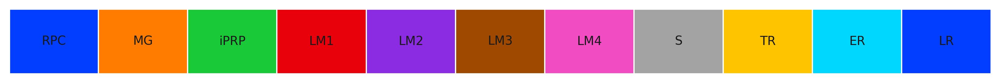

In [150]:
sns.set()
sns.set(font_scale=0.8)
fig = palplot( colors, cats, size=1.0)

Text(0.5, -142.80833333333342, '')

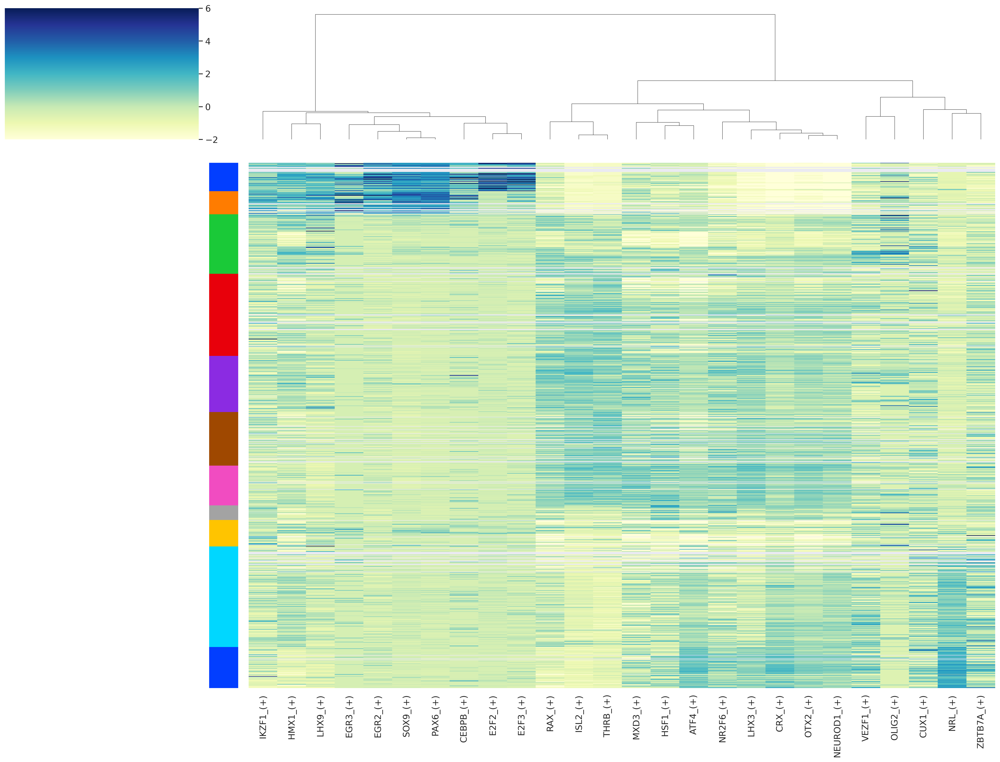

In [151]:
import scipy.spatial as sp, scipy.cluster.hierarchy as hc

# change row_cluster argument to cluster by ward or else order by specified cell metadata (whatever is currently assigned to metavar)

sns.set(font_scale=1.2)


col_dism = 1 - auc_mtx_Z[topreg].corr()
col_linkage = hc.linkage(sp.distance.squareform(col_dism), method='ward')

g = sns.clustermap(auc_mtx_Z[topreg], mask=False,  square=False,  linecolor='gray',
    yticklabels=False, vmin=-2, vmax=6, row_colors=colormap, col_linkage = col_linkage, row_cluster=False, method = 'ward',
    cmap="YlGnBu", figsize=(21,16) )
g.cax.set_visible(True)
g.ax_heatmap.set_ylabel('')    
g.ax_heatmap.set_xlabel('')    

In [152]:
g.savefig('scenic_louvain_cluster_heatmap.png', dpi=600, bbox_inches='tight')

### Generate a binary regulon activity matrix:

In [153]:
# binary_mtx, auc_thresholds = binarize(auc_mtx, num_workers=6)
# binary_mtx.head()

### Show the AUC distributions for selected regulons

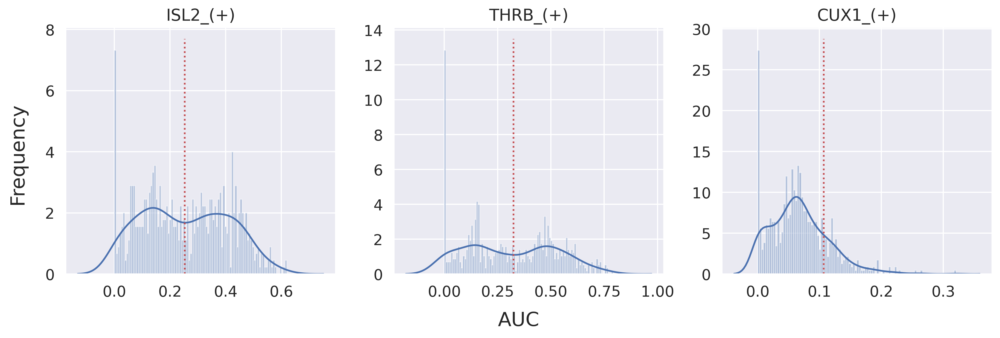

In [154]:
# select regulons:
r = [ 'ISL2_(+)', 'THRB_(+)', 'CUX1_(+)','NRL_(+)' ]

fig, axs = plt.subplots(1, 3, figsize=(12, 4), dpi=150, sharey=False)
for i,ax in enumerate(axs):
    sns.distplot(auc_mtx[ r[i] ], ax=ax, norm_hist=True, bins=100)
    ax.plot( [ thresholds[ r[i] ] ]*2, ax.get_ylim(), 'r:')
    ax.title.set_text( r[i] )
    ax.set_xlabel('')

fig.text(-0.01, 0.5, 'Frequency', ha='center', va='center', rotation='vertical', size='large')
fig.text(0.5, -0.01, 'AUC', ha='center', va='center', rotation='horizontal', size='large')

fig.tight_layout()
fig.savefig('PBMC10k_cellType-binaryPlot2.pdf', dpi=600, bbox_inches='tight')

# display regulon scores on umap

In [155]:
# read seurat object
import scanpy as sc
adata = sc.read_h5ad("output/scanpy/Final_dataset_duplicate_070320.h5ad")

/opt/miniconda3/envs/scenic_protocol/lib/python3.6/site-packages/anndata/compat/__init__.py:161: FutureWarning: Moving element from .uns['neighbors']['distances'] to .obsp['distances'].

This is where adjacency matrices should go now.
  FutureWarning,


In [156]:
auc_mtx.index = auc_mtx.index.str.replace("ds20170407_S", "ds20170407-")
auc_mtx

,ATF4_(+),CEBPB_(+),CRX_(+),CUX1_(+),E2F1_(+),E2F2_(+),E2F3_(+),E2F4_(+),E2F7_(+),E2F8_(+),...,SOX2_(+),SOX9_(+),SP3_(+),SPI1_(+),TFDP1_(+),THAP11_(+),THRB_(+),VEZF1_(+),VSX2_(+),ZBTB7A_(+)
ds20181001-0335,0.202176,0.095761,0.077103,0.047539,0.271235,0.296594,0.327836,0.051704,0.232920,0.281454,...,0.241304,0.210866,0.225481,0.016863,0.348512,0.127709,0.000000,0.378504,0.244702,0.041673
20200312-DS-dissected-68,0.184503,0.068393,0.029393,0.000000,0.220169,0.417692,0.185124,0.061393,0.222496,0.232541,...,0.247806,0.208128,0.046040,0.000000,0.314636,0.133475,0.000000,0.057949,0.246001,0.079116
20200312-DS-dissected-25,0.187522,0.066901,0.019999,0.044989,0.205027,0.176629,0.167119,0.069128,0.164111,0.132555,...,0.252980,0.176470,0.060767,0.000000,0.249587,0.137513,0.021794,0.000000,0.238695,0.065706
ds20171031_268,0.183204,0.078046,0.036416,0.069276,0.259558,0.129752,0.090013,0.032895,0.199849,0.185605,...,0.312123,0.249975,0.027490,0.028229,0.236588,0.158063,0.000000,0.055620,0.314623,0.022590
20200312-DS-dissected-16,0.170610,0.015848,0.038655,0.000000,0.185110,0.074985,0.075617,0.036681,0.119055,0.087083,...,0.263185,0.235000,0.075011,0.000000,0.187746,0.145138,0.000000,0.089476,0.252822,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ds20170407-337,0.239769,0.000000,0.553756,0.014709,0.076198,0.000000,0.019507,0.036193,0.046524,0.057849,...,0.035120,0.036536,0.017241,0.000000,0.164296,0.143700,0.159352,0.096820,0.062090,0.114146
ds20170407-401,0.239458,0.030303,0.523697,0.012987,0.064904,0.015490,0.004491,0.025323,0.056214,0.051909,...,0.053513,0.036210,0.010472,0.000000,0.134882,0.116064,0.120540,0.365249,0.063047,0.119719
ds20170407-400,0.267862,0.016993,0.572051,0.048882,0.053723,0.000000,0.000000,0.000000,0.050348,0.036731,...,0.065004,0.034358,0.041321,0.000000,0.132936,0.150257,0.132184,0.075235,0.064698,0.098846
ds20170407-389,0.286605,0.000000,0.567223,0.088567,0.064192,0.007600,0.005479,0.045393,0.044843,0.032664,...,0.059854,0.045330,0.060491,0.000000,0.137573,0.099885,0.019928,0.434931,0.070170,0.115390


In [157]:
adata.obs[auc_mtx.columns] = auc_mtx

In [158]:
adata.obs

,orig.ident,nCount_RNA,nFeature_RNA,Sample_ID,batch,Kit_ID,Seq_Number,X5,Poor_Read_Number,Moderate_Alignment,...,SOX2_(+),SOX9_(+),SP3_(+),SPI1_(+),TFDP1_(+),THAP11_(+),THRB_(+),VEZF1_(+),VSX2_(+),ZBTB7A_(+)
ds20170407-442,ds20170407,1.873634e+06,5578.0,ds20170407_S442,20170407-DS-C1-Hs,C1,1.0,2,2,2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ds20170407-443,ds20170407,1.012991e+06,6003.0,ds20170407_S443,20170407-DS-C1-Hs,C1,1.0,2,2,2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ds20170407-444,ds20170407,2.598136e+06,6789.0,ds20170407_S444,20170407-DS-C1-Hs,C1,1.0,2,2,2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ds20170407-445,ds20170407,2.638103e+06,6043.0,ds20170407_S445,20170407-DS-C1-Hs,C1,1.0,2,2,2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ds20170407-447,ds20170407,2.414070e+06,5549.0,ds20170407_S447,20170407-DS-C1-Hs,C1,1.0,2,2,2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
hs20151130-SC3-86,hs20151130,6.787668e+05,4360.0,NA,20151130-HS-C1-Hs,NA,NaN,2,2,2,...,0.063992,0.061566,0.009508,0.000000,0.077047,0.041200,0.000000,0.138737,0.062869,0.078370
hs20151130-SC3-89,hs20151130,5.020281e+05,5019.0,NA,20151130-HS-C1-Hs,NA,NaN,2,2,2,...,0.040724,0.036707,0.013659,0.000000,0.096039,0.052309,0.547544,0.140618,0.046317,0.152958
hs20151130-SC3-9,hs20151130,9.205718e+05,7875.0,NA,20151130-HS-C1-Hs,NA,NaN,2,2,2,...,0.056835,0.033386,0.000000,0.000000,0.072638,0.059872,0.562099,0.091178,0.054021,0.091581
hs20151130-SC3-90,hs20151130,1.146995e+06,5864.0,NA,20151130-HS-C1-Hs,NA,NaN,2,2,2,...,0.071108,0.055638,0.022529,0.000000,0.124183,0.061875,0.527691,0.090909,0.078803,0.109345


In [159]:
auc_mtx

,ATF4_(+),CEBPB_(+),CRX_(+),CUX1_(+),E2F1_(+),E2F2_(+),E2F3_(+),E2F4_(+),E2F7_(+),E2F8_(+),...,SOX2_(+),SOX9_(+),SP3_(+),SPI1_(+),TFDP1_(+),THAP11_(+),THRB_(+),VEZF1_(+),VSX2_(+),ZBTB7A_(+)
ds20181001-0335,0.202176,0.095761,0.077103,0.047539,0.271235,0.296594,0.327836,0.051704,0.232920,0.281454,...,0.241304,0.210866,0.225481,0.016863,0.348512,0.127709,0.000000,0.378504,0.244702,0.041673
20200312-DS-dissected-68,0.184503,0.068393,0.029393,0.000000,0.220169,0.417692,0.185124,0.061393,0.222496,0.232541,...,0.247806,0.208128,0.046040,0.000000,0.314636,0.133475,0.000000,0.057949,0.246001,0.079116
20200312-DS-dissected-25,0.187522,0.066901,0.019999,0.044989,0.205027,0.176629,0.167119,0.069128,0.164111,0.132555,...,0.252980,0.176470,0.060767,0.000000,0.249587,0.137513,0.021794,0.000000,0.238695,0.065706
ds20171031_268,0.183204,0.078046,0.036416,0.069276,0.259558,0.129752,0.090013,0.032895,0.199849,0.185605,...,0.312123,0.249975,0.027490,0.028229,0.236588,0.158063,0.000000,0.055620,0.314623,0.022590
20200312-DS-dissected-16,0.170610,0.015848,0.038655,0.000000,0.185110,0.074985,0.075617,0.036681,0.119055,0.087083,...,0.263185,0.235000,0.075011,0.000000,0.187746,0.145138,0.000000,0.089476,0.252822,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ds20170407-337,0.239769,0.000000,0.553756,0.014709,0.076198,0.000000,0.019507,0.036193,0.046524,0.057849,...,0.035120,0.036536,0.017241,0.000000,0.164296,0.143700,0.159352,0.096820,0.062090,0.114146
ds20170407-401,0.239458,0.030303,0.523697,0.012987,0.064904,0.015490,0.004491,0.025323,0.056214,0.051909,...,0.053513,0.036210,0.010472,0.000000,0.134882,0.116064,0.120540,0.365249,0.063047,0.119719
ds20170407-400,0.267862,0.016993,0.572051,0.048882,0.053723,0.000000,0.000000,0.000000,0.050348,0.036731,...,0.065004,0.034358,0.041321,0.000000,0.132936,0.150257,0.132184,0.075235,0.064698,0.098846
ds20170407-389,0.286605,0.000000,0.567223,0.088567,0.064192,0.007600,0.005479,0.045393,0.044843,0.032664,...,0.059854,0.045330,0.060491,0.000000,0.137573,0.099885,0.019928,0.434931,0.070170,0.115390


In [160]:
auc_mtx.to_csv(r'/dataVolume/storage/single_cell_projects/integrated_projects/7-seq_050120/src/scenic/122320_SCENIC_AUC_ByCell.csv', index = True)

In [161]:
mean_regulon_by_meta.loc[:,"NRL_(+)"]

cell_type
RPC     0.136476
MG      0.134701
iPRP    0.152799
LM1     0.155711
LM2     0.174499
LM3     0.163473
LM4     0.195822
S       0.195068
TR      0.198710
ER      0.429427
LR      0.655946
Name: NRL_(+), dtype: float64

In [162]:
sc.pl.umap(adata, color=auc_mtx.columns)

... storing 'orig.ident' as categorical
... storing 'Sample_ID' as categorical
... storing 'batch' as categorical
... storing 'Kit_ID' as categorical
... storing 'Collection_Method' as categorical
... storing 'Outliers' as categorical
... storing 'X9_Cluster_Green_Rods' as categorical
... storing 'HR_Cluster_LB' as categorical
... storing 'HR_Cluster_Black' as categorical
... storing 'HR_Cluster_LG' as categorical
... storing 'HR_Cluster_DG' as categorical
... storing 'Cluster_Color' as categorical
... storing 'sample_name' as categorical
... storing 'index_1_i7' as categorical
... storing 'i7_bases' as categorical
... storing 'index_2_i5' as categorical
... storing 'i5_bases_for_hiseq3000_4000' as categorical
... storing 'index_3' as categorical
... storing 'Tissue.Type' as categorical
... storing 'tissue_type' as categorical
... storing 'excluded_because' as categorical
... storing 'sample_id' as categorical
... storing 'names' as categorical
... storing 'type' as categorical
... sto